# 2020-11-09

## Working on functions/tools for Hi-C analysis

In [1]:
# Import public packages.
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import ndimage as ndi 
from importlib import reload
import pickle
import czifile
import skimage as ski

# Import my packages.
import sys
sys.path.append('/Users/michaelstadler/Bioinformatics/Projects/hic/bin')
import hic_viewer as vw
from hic_viewer import viewer
sys.path.append('/Users/michaelstadler/Bioinformatics/Projects/rpb1/bin')
import imagep as im

### QC and distance decay

samechr: 889661
diffchr: 110339
pp: 172767
mm: 174008
pm: 542886


<ipython-input-24-9b24b73aaf9b>:46: RuntimeWarning: divide by zero encountered in log
  ax[0].plot(np.log(dist)/np.log(10), np.log(freq)/np.log(10));
<ipython-input-24-9b24b73aaf9b>:48: RuntimeWarning: divide by zero encountered in log
  ax[1].plot(dist, np.log(freq)/np.log(10));


<Figure size 432x288 with 0 Axes>

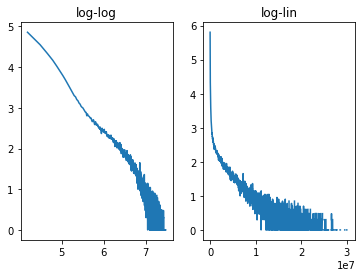

In [24]:
import gzip
def qc(filepath, n=1000):
    f = gzip.open(filepath, 'r')
    samech = 0
    diffch = 0
    dist = []
    bins = 2000
    
    pp = 0
    pm = 0
    mm = 0
    count = 0
    
    for l in f:
        l = l.decode('utf-8')
        count = count + 1
        if (count > n):
            break
        l = l.strip()
        l = l.split()
        strand1, chr1, loc1, strand2, chr2, loc2 = l[1:7]
        if (chr1 == chr2):
            samech = samech + 1
            # Count strand combos
            if (strand1 == '+' and strand2 == '+'):
                pp = pp + 1
            elif(strand1 == '-' and strand2 == '-'):
                mm = mm + 1
            else:
                pm = pm + 1
            
            dist.append(abs(int(loc1) - int(loc2)))
        else:
            diffch = diffch + 1
        
    print('samechr: ' + str(samech))
    print('diffchr: ' + str(diffch))
    print('pp: ' + str(pp))
    print('mm: ' + str(mm))
    print('pm: ' + str(pm))
    h = plt.hist(dist, bins=bins);
    dist = h[1][:bins]
    freq = h[0]
    plt.clf()
    fig, ax = plt.subplots(1,2)
    ax[0].plot(np.log(dist)/np.log(10), np.log(freq)/np.log(10));
    ax[0].set_title('log-log')
    ax[1].plot(dist, np.log(freq)/np.log(10));
    ax[1].set_title('log-lin')    

d = qc('/Users/michaelstadler/Bioinformatics/Projects/hic/data/HiC-63_mappingV1_4_unique_pairMergedV3_collapsed.txt.gz', 1000000)

In [4]:
f1 = open('/Users/michaelstadler/Bioinformatics/Projects/hic/outputs/HiC-66_CompressedBinCounts_500bp_2L.txt', 'r')
f2 = open('/Users/michaelstadler/Bioinformatics/Projects/hic/outputs/HiC-68_CompressedBinCounts_500bp_2L.txt', 'r')

def add(l, data):
    chr_ = l[0]
    if (chr_[0] == '#'):
        bin_, val = l[1:3]
        if (chr_ not in data):
            data[chr_] = {}
        data[chr_][bin_] = val
    else:
        bin1, bin2, val = l[1:4]
        if (chr_ not in data):
            data[chr_] = {}
        if (bin1 not in data[chr_]):
            data[chr_][bin1] = {}
        data[chr_][bin1][bin2] = val

n=0
data = {}
for l in f1:
    l = l.strip()
    l = l.split()
    add(l, data)

print('blurp')

for l in f2:
    l = l.strip()
    if (l[0] == '#'):
        (chr_, bin_, val) = l.split()
        valsum = float(val) + float(data[chr_][bin_])
        #print(chr_ + '\t' + bin_ + '\t' + str(valsum))

    else:
        (chr_, bin1, bin2, val) = l.split()
        valsum = float(val) + float(data[chr_][bin1][bin2])
        print(chr_ + '\t' + bin1 + '\t' + bin2 + '\t' + str(valsum))

f1.close()
f2.close()
    

FileNotFoundError: [Errno 2] No such file or directory: '/Users/michaelstadler/Bioinformatics/Projects/hic/outputs/HiC-66_CompressedBinCounts_500bp_2L.txt'

In [ ]:
# Import my packages.
import sys
sys.path.append('/Users/michaelstadler/Bioinformatics/Projects/hic/bin')
import hic_viewer as vw
from hic_viewer import viewer

In [ ]:
%matplotlib qt
reload(vw)
vw.viewer('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-66-68', '/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/saves','/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/viewer_tracks')

### Make aggregate position function

Take a file of positions (chr, bp) and hic viewer maps (staggered matrices), find location in those maps.

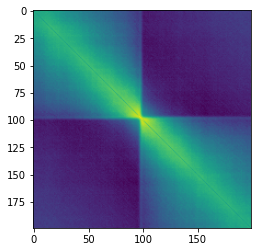

In [544]:
import os
import re

def load_viewer_file(infilename, size=400):
        """Load viewer file of a Hi-C matrix, replace 0s and NaNs with dummy values, 
        trim outliers, take log.
        
        Args:
            infilename: string
                HiC matrix (panel) file
        
            size: int
                Expected size (rows and columns) of matrix
                
        Returns:
            x: numpy ndarray
                2D matrix of processed Hi-C data
        """
        # Load data.
        x = np.genfromtxt(infilename)
        # Resolve 0s and NaNs by setting to dummy value 0.1.
        dummy_val = 0.1
        x[x == 0] = dummy_val
        x[np.isnan(x)] = dummy_val
        # Remove large outlier values using a percentile cutoff.
        upper_trim = 99.9
        max_val = np.percentile(x, upper_trim)
        x[x > max_val] = max_val
        # Take the log.
        x = np.log(x)
        # Scale to a range of 0-1000.
        x = (x - np.min(x)) / (np.max(x) - np.min(x)) * 1000
        return(x)

def load_panels(data_folder, binsize=500):
    """Load hi-c panels (viewer) data into memory.
    
    Args: 
        data_folder: folder
            Folder containing hi-c panels (viewer files)
        binsize: int
            Binsize (in base pairs) of the panels to load.
            
    Returns:
        panels: dict of dict of ndarray
            Keys are chromosome, then bin1 (left-most), value is
            2d numpy ndarray with hi-c data.
    """
    
    panels = {}
    for filename in os.listdir(data_folder):
        if (re.search(str(binsize) + '.txt', filename)):
            chr_, loc1, loc2, _ = filename.split('_')
            x = load_viewer_file(os.path.join(data_folder, filename))
            if (chr_ not in panels):
                panels[chr_] = {}
            panels[chr_][int(loc1)] = x
    return panels

def load_gff3(gff_filename):
    """Load gff3 file, storing chrom, position, score in pandas df
    
    Args:
        gff_filename: string
            Path to gff3 file
    
    Returns:
        gff: pandas DF
            Each row is gff entry, col 0: chromosome, 1: mean position,
            2: score
    """
    chr_col = 0
    posL_col = 3
    posR_col = 4
    score_col = 5
    gff_file = open(gff_filename, 'r')
    chrs = []
    pos = []
    scores = []
    
    for l in gff_file:
        if (not l[0] == '#'):
            items = l.split('\t')
            chr_ = items[chr_col]
            if (chr_[0:3] == 'chr'):
                chr_ = chr_[3:]
            if (chr_ in ['2L', '2R', '3L', '3R', 'X']):
                posL = int(items[posL_col])
                posR = int(items[posR_col])
                pos.append(np.mean([posL, posR]))
                chrs.append(chr_)
                scores.append(float(items[score_col]))
    gff = pd.DataFrame([chrs, pos, scores])
    return gff.T

def aggregate_signal_gff_landmarks(panels, gff, rad=20, binsize=500):
    """Aggregate the Hi-C signal around genomic positions in a gff file
    
    Produces the sum of the input hi-c signal around the supplied genomic
    positions.
    
    Args:
        panels: dict of dict of ndarray
            Keys are chromosome, then bin1 (left-most), value is
            2d numpy ndarray with hi-c data.
        gff: pandas DF
            Each row is gff entry, col 0: chromosome, 1: mean position,
            2: score
        rad: int
            "Radius" (halfwidth in x and y) of the region to be summed
        binsize: int
            Binsize of data to use (500, 1000, 2000, or 4000)
        
    Returns:
        sum_: ndarray
            Square array of dimension 2*rad + 1 containing summed signal
    """
    stepsize = binsize * 200
    lw = (2*rad) + 1
    # Initialize sum array with lengt/width according to rad.
    sum_ = np.zeros((lw, lw))
            
    for i in range(0, len(gff.index)):
        chr_, pos, score = gff.iloc[i]
        if (chr_ in panels):
            panel_start = int(pos / stepsize) * stepsize
            # If start is off of this panel, move back one step.
            if ((pos - (rad * binsize)) < panel_start):
                panel_start = panel_start - stepsize
            if (panel_start >= 0 and panel_start in panels[chr_]):
                panel = panels[chr_][panel_start]
                bin_ = int(pos / binsize) - int(panel_start / binsize) + 1
                start = bin_ - rad
                stop = bin_ + rad + 1
                sub = panel[start:stop, start:stop]
                sub[np.isnan(sub)] = 0
                sum_ += sub

    return sum_            

def aggregate_signal_gff_landmarks_norm(panels, gff, rad=20, binsize=500):
    """aggregate_signal_gff_landmarks with normalization
    
    Wrapper for aggregate_signal_gff_landmarks. Generates a "randomized"
    normalization matrix by permuting chromosome labels. Randomized matrix
    accounts for distance decay (and potentially other features of data).
    
    Args:
        panels: dict of dict of ndarray
            Keys are chromosome, then bin1 (left-most), value is
            2d numpy ndarray with hi-c data.
        gff: pandas DF
            Each row is gff entry, col 0: chromosome, 1: mean position,
            2: score
        rad: int
            "Radius" (halfwidth in x and y) of the region to be summed
        binsize: int
            Binsize of data to use (500, 1000, 2000, or 4000)
        
    Returns:
        signal: ndarray
            Square array of dimension 2*rad + 1 containing summed signal
    
    """
    def swap_chrs_gff(gff_orig):
        """Make shuffled version of a gff data structure by 'shifting' each
        chromosome by one (not random--chromosome will never be itself)"""
        gff = gff_orig.copy()
        chrs = np.unique(gff[0])
        convert = {}
        convert[chrs[0]] = chrs[-1]
        for i in range(1,len(chrs)):
            convert[chrs[i]] = chrs[i-1]
        for i in range(0, len(gff.index)):
            gff.iloc[i,0] = convert[gff.iloc[i,0]]
        return gff

    signal_real = aggregate_signal_gff_landmarks(panels, gff, rad, binsize)
    signal_shuff = aggregate_signal_gff_landmarks(panels, swap_chrs_gff(gff), rad, binsize)
    # Subtract because inputs (normalized counts) are already log.
    return signal_real - signal_shuff

b=aggregate_signal_gff_landmarks_norm(panels, gff, binsize=500, rad=99)
plt.imshow(b)

In [541]:
len(gff)

7731

In [522]:
panels = load_panels('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-53-54')

In [ ]:
a,b,c=aggregate_signal_gff_landmarks_norm(panels, gff, binsize=500, rad=99)
fig, ax = plt.subplots(1,3, figsize=(5,10))
ax[0].imshow(a)
ax[1].imshow(b)
ax[2].imshow(c)

UnboundLocalError: local variable 'agg' referenced before assignment

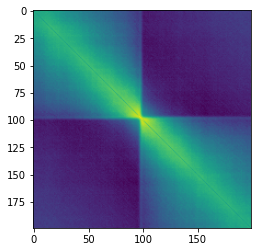

In [499]:
b=aggregate_signal_gff_landmarks_norm(panels, gff, binsize=500, rad=99)
plt.imshow(b)

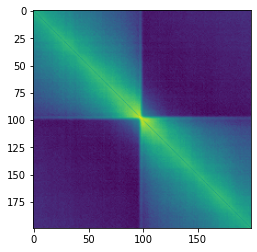

In [260]:
b=aggregate_signal_gff_landmarks_norm(panels, gff,0, 3, binsize=500, rad=99)
plt.imshow(b)

In [235]:
t = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CTCF:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_769_dm6.gff3')
#for entry in range(0, len(t.index)):
a, b, c = t.iloc[0]
b

15901.0

Idea: Take a line of a fixed distance from the diagonal. For that line, the insulation score is the difference (or quotient) of the mean scores in the green vs. blue triangle. Then for each feature, we can create an insulation profile with the insulation score as a function of distance (off the diagonal). 

In [26]:
a=aggregate_hic(panels, '/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CP190:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_22_dm6.gff3',0, 3, rad=40)
im.viewer(a, 4)

10328


interactive(children=(Dropdown(description='Color', index=5, options=('magma', 'gray_r', 'prism', 'gray', 'inf…

6397


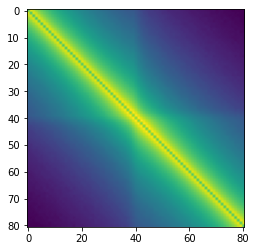

In [27]:
file='/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/GAF:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_23_dm6.gff3'
a=aggregate_hic(panels, file,0, 3, rad=40)
#im.viewer(a, 4)
plt.imshow(a)

Some futzing around trying to figure out binning of numpy arrays for re-writing panel maker:

In [ ]:
x=a[0:80,0:80]
#a.reshape((2,a.shape[0]//2,3,-1)).mean(axis=3).mean(1)
x.reshape((2,x.shape[0]//2,3,-1)).mean(axis=3).mean(1)

In [ ]:
x=a[0:80,0:80]
print(x)
def rebin(arr, new_shape):
    shape = (new_shape[0], arr.shape[0] // new_shape[0],
             new_shape[1], arr.shape[1] // new_shape[1])
    print(shape)
    return arr.reshape(shape).sum(-1).sum(1)
plt.imshow(rebin(x, (10,10)))

In [ ]:
def rebin_1d(arr, new_shape):
    shape = (new_shape[0], arr.shape[0] // new_shape[0],)
    return arr.reshape(shape).sum(-1)
rebin_1d(np.array([1,2,3,4,5,6]), [3])

In [ ]:
a = np.array([1,2,3,4])
b = np.array([5,6,7,8])
np.outer(a,b)

### Subsampling from compressed bin count files

In [31]:
from numpy.random import choice
list_of_candidates=[1,2,3]
number_of_items_to_pick = 10
probability_distribution=[0.1,0.1,0.8]
draw = choice(list_of_candidates, number_of_items_to_pick,
              p=probability_distribution)

In [575]:
filename = '/Users/michaelstadler/Bioinformatics/Projects/hic/outputs/hic-56-57-58-59-64/virilis_CompressedBinCounts_500bp_scaffold_12100.txt'
outfile = '/Users/michaelstadler/Bioinformatics/Projects/hic/outputs/sampling_test/scaffold_12100_sampled.txt'

def downsample_match_compressed_bin(small_filename, big_filename, outfilename, width=3500):
    """Downsample a compressed_bin file to match a lower-coverage file
    
    Args:
        small_filename: string
            Compressed bin file with fewer counts
        big_filename: string
            Compressed bin file with more counts
        outfilename: string
            File to write down-sampled output to
        width: int
            Width, in bins, of input data
    
    Returns: None
    """
    
    def get_count(bin_bin_counts, bin1, bin2):
        """Get count for a single orientation of a bin-bin linkage"""
        if (bin1 in bin_bin_counts):
            if (bin2 in bin_bin_counts[bin1]):
                return bin_bin_counts[bin1][bin2]
        return 0
    
    # Get the total counts in the smaller file (note, bins will 
    # be double counted but since we are just looking for a comparison, it works)
    total_smallfile = 0
    f1 = open(small_filename, 'r')
    for line in f1:
        line = line.rstrip()
        if (line[0] == '#'):
            continue
        items = line.split()
        count = float(items[3])
        total_smallfile += count
    f1.close()

    # Read in data from larger file. bin_names is a list that stores the first three columns
    # of the file, counts is a list that stores the counts. They are index-matched, so that 
    # we can draw from counts and use the indexes to get the corresponding bins.
    bin_pair_names = []
    counts = np.array([])
    max_bin = 0
    f2 = open(big_filename, 'r')
    for line in f2:
        line = line.rstrip()
        if (line[0] == '#'):
            continue
        items = line.split()
        # Update max bin.
        max_ = max(int(items[1]), int(items[2]))
        if (max_ > max_bin):
            max_bin = max_
        bin_pair_name = '\t'.join(items[0:3])
        count = float(items[3])
        bin_pair_names.append(bin_pair_name)
        counts = np.append(counts,count)
        
    f2.close()
    
    # Draw reads from larger file.
    """
    There is a complication here. I'm drawing from the bin pairs independently, but
    they're not independent — bin 10-bin 14 is the same as bin 14-bin 10. To compensate
    for this, we divide the number of draws by 2. When we go to write the outputs, we
    will sum the draws from the two orientations of each bin pair.
    """
    total_reads = counts.sum()
    number_to_draw = int(total_smallfile/ 2)
    probs = counts / total_reads
    # Randomly sample indexes (0 to length of bin_pair_names), without replacement, according
    # to probabilities based on counts in the original file.
    draw = np.random.choice(np.arange(0,len(bin_pair_names)), number_to_draw,
              p=probs, replace=False)
    # Count up the occurences of each index.
    indexes, index_counts = np.unique(draw, return_counts=True)
    
    # Get chromosome name.
    chr_ = bin_pair_names[0].split('\t')[0]
    
    # From the sampled indexes and counts, build up bin_bin_counts 
    # and bin_counts to store paired linkage counts and total counts.
    bin_counts = np.zeros(max_bin + 1)
    bin_bin_counts = {}
    for i in range(0, len(indexes)):
        index = indexes[i]
        count = index_counts[i]
        bin_name = bin_pair_names[index]
        chr, bin1, bin2 = bin_name.split()
        bin1 = int(bin1)
        bin2 = int(bin2)
        
        if (bin1 not in bin_bin_counts):
            bin_bin_counts[bin1] = {}
        bin_bin_counts[bin1][bin2] = count

        bin_counts[bin1] += 1
        if (bin1 != bin2):
            bin_counts[bin2] += 1
    
    # Write output with total counts and bin linkage counts.
    outfile = open(outfilename, 'w')
    for i in range(0, len(bin_counts)):
        outfile.write('#' + chr_ + '\t' + str(i) + '\t' + str(bin_counts[i]) + '\n')
            
    for bin1 in range(0, max_bin):
        for bin2 in range(max(0, bin1 - width), min(max_bin, bin1 + width)):
            # Get counts for bin pair from each orientation.
            count1 = get_count(bin_bin_counts, bin1, bin2)
            count2 = get_count(bin_bin_counts, bin2, bin1)
            symmetric_count = count1 + count2
            if (symmetric_count > 0):
                outfile.write(chr_ + '\t' + str(bin1) + '\t' + str(bin2) + '\t' + str(symmetric_count) + '\n')
        
        
    outfile.close()
downsample_match_compressed_bin('/Users/michaelstadler/Bioinformatics/Projects/hic/testsmall.txt',
                                '/Users/michaelstadler/Bioinformatics/Projects/hic/testbig.txt',
                                '/Users/michaelstadler/Bioinformatics/Projects/hic/testout.txt')
        

32552.0
55074.0


In [573]:
file = '/Users/michaelstadler/Bioinformatics/Projects/hic/testout.txt'
total = 0
f = open(file, 'r')
for line in f:
    if (line[0] == '#'):
        chr_, bin1, count = line.split()
        total += float(count)


In [574]:
total

32161.0

In [566]:
total

34735.0

In [564]:
total

56537.0

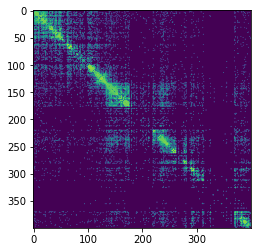

In [91]:
plt.imshow(load_viewer_file('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/virilis-56to59-64/scaffold-12100_0_200000_500.txt.gz'))

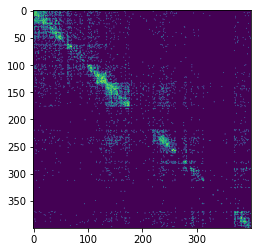

In [95]:
plt.imshow(load_viewer_file(
    '/Users/michaelstadler/Bioinformatics/Projects/hic/outputs/sampling_test/sample_viewer/test_0_200000_500.txt.gz'))

This seems to work well. On to the next.

### Insulation score for average maps

Re-upping from above:

Idea: Take a line of a fixed distance from the diagonal. For that line, the insulation score is the difference (or quotient) of the mean scores in the green vs. blue triangle. Then for each feature, we can create an insulation profile with the insulation score as a function of distance (off the diagonal).

<ipython-input-598-3e97f43f668a>:41: RuntimeWarning: Mean of empty slice.
  scores.append(non_insulated.mean() / insulated.mean())


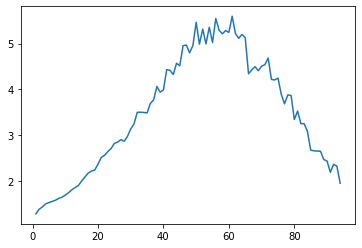

In [598]:
#agg = a # Chriz sites

def insulation_cum_dist(agg_orig, buffer=2, min_dist=3, max_dist=100):
    """Calculate an insulation score as a function of distance from an aggregate 
    Hi-C matrix
    
    Description: Starts with a matrix of the aggregate Hi-C data in which the feature
    is in the center of the matrix. Insulation score compares the signal at a fixed 
    genomic distance either across the feature or in the opposite direction (agnostic
    to whether features present or not). Visually, one can think of the aggregate matrix
    in four quadrants, (I to IV clockwise from top left), with quadrants II and IV
    representing interactions across the feature and I and III being not across it. 
    To get the score at a given distance, we draw a line of slope -1 at a the desired 
    distance from the diagonal, and compare the mean signal of the pixels in the "across"
    region to the "not across" region.
    
    
    """
    agg = agg_orig.copy()
    # Reset minimum value to 0 to avoid negative number problems.
    if (agg.min() < 0):
        agg = agg - agg.min()
    # Make mesh grid.
    y, x = mesh_like(agg, 2)
    # Make a grid of distances to the diagonal, with positive values to upper right.
    dist_diag = x-y
    midpoint = int(agg.shape[0] / 2)
    # Define insulated region as top right quadrant (when displayed as an image: y-axis is backwards).
    insulated_region = (x > (midpoint + buffer)) & (y < (midpoint - buffer))
    noninsulated_region = (x < (midpoint - buffer)) | (y > (midpoint + buffer))
    scores = []
    
    # Go through range of distances off diagonal, compute insulation at each distance.
    for dist in range(min_dist, max_dist):
        insulated_indexes = np.where((dist_diag == dist) & insulated_region)
        # Restrict non-insulated pixels to the regions where one of the points at 
        # distance dist is across the midpoint.
        xlim = midpoint - dist
        ylim = midpoint + dist
        non_insulated_indexes = np.where(noninsulated_region & (x >= xlim) & (y <= ylim) & (dist_diag == dist))
        insulated = agg[insulated_indexes]  
        non_insulated = agg[non_insulated_indexes]
        # Is division the right thing here?
        scores.append(non_insulated.mean() / insulated.mean())
    return scores
plt.plot(insulation_cum_dist(b,1,3,100))

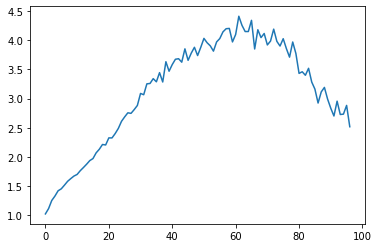

In [342]:
#agg=aggregate_signal_gff_landmarks_norm(panels, gff, binsize=500, rad=99, n=2)

#agg = agg + abs(agg.min())
#plt.imshow(agg)
plt.plot(insulation_score(agg))


In [339]:
agg.min()

-400836.18384016515

4378


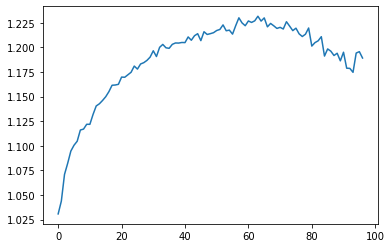

In [187]:
# dCTCF 
agg=aggregate_hic(panels, '/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CTCF:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_769_dm6.gff3',0, 3, binsize=500, rad=99)
insulation_score(agg)

In [ ]:
# GAF 
agg=aggregate_hic(panels, '/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/GAF:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_23_dm6.gff3',0, 3, binsize=500, rad=99)
insulation_score(agg)

In [414]:
def temp(panels, gff, rad=20, binsize=500):
    t1, t2 = np.percentile(list(gff.iloc[:,2]), (33, 66))
    gff_1 = gff[gff.iloc[:,2] <= t1]
    gff_2 = gff[(gff.iloc[:,2] > t1) & (gff.iloc[:,2] < t2)]
    gff_3 = gff[gff.iloc[:,2] >= t2]
    signal_norm_all = aggregate_signal_gff_landmarks_norm(panels, gff, rad, binsize)
    signal_norm_1 = aggregate_signal_gff_landmarks_norm(panels, gff_1, rad, binsize)
    signal_norm_2 = aggregate_signal_gff_landmarks_norm(panels, gff_2, rad, binsize)
    signal_norm_3 = aggregate_signal_gff_landmarks_norm(panels, gff_3, rad, binsize)
    
    fig, ax = plt.subplots(4,2, figsize=(15,15))
    ax[0][0].imshow(signal_norm_all)
    ax[1][0].imshow(signal_norm_1)
    ax[2][0].imshow(signal_norm_2)
    ax[3][0].imshow(signal_norm_3)
    ax[0][1].plot(insulation_score(signal_norm_all))
    ax[1][1].plot(insulation_score(signal_norm_1))
    ax[2][1].plot(insulation_score(signal_norm_2))
    ax[3][1].plot(insulation_score(signal_norm_3))

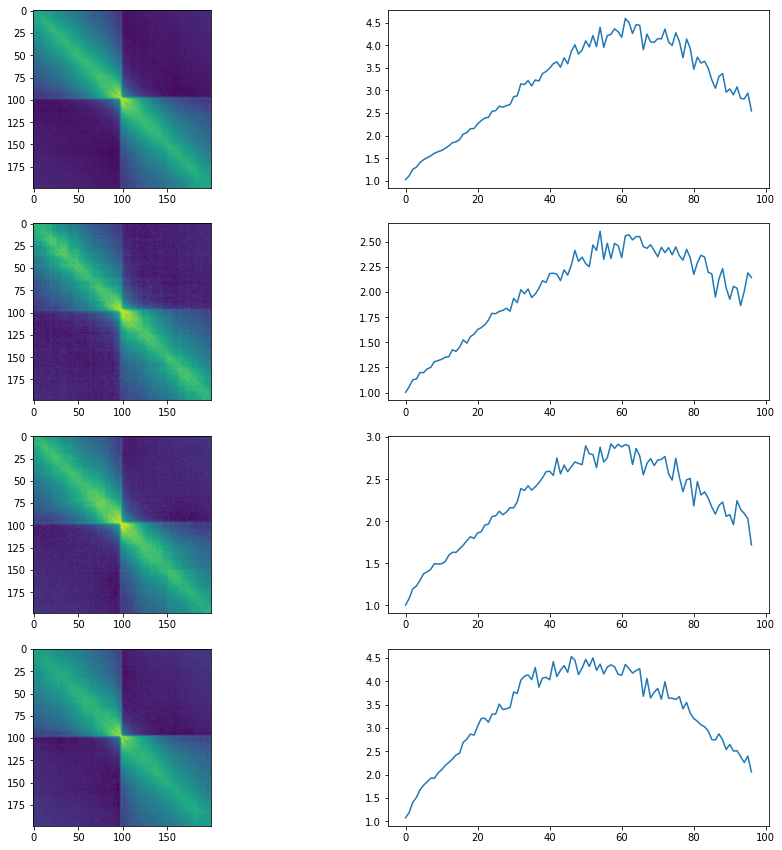

In [416]:
#cp190
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CP190:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_22_dm6.gff3')
temp(panels, gff, binsize=500, rad=99)

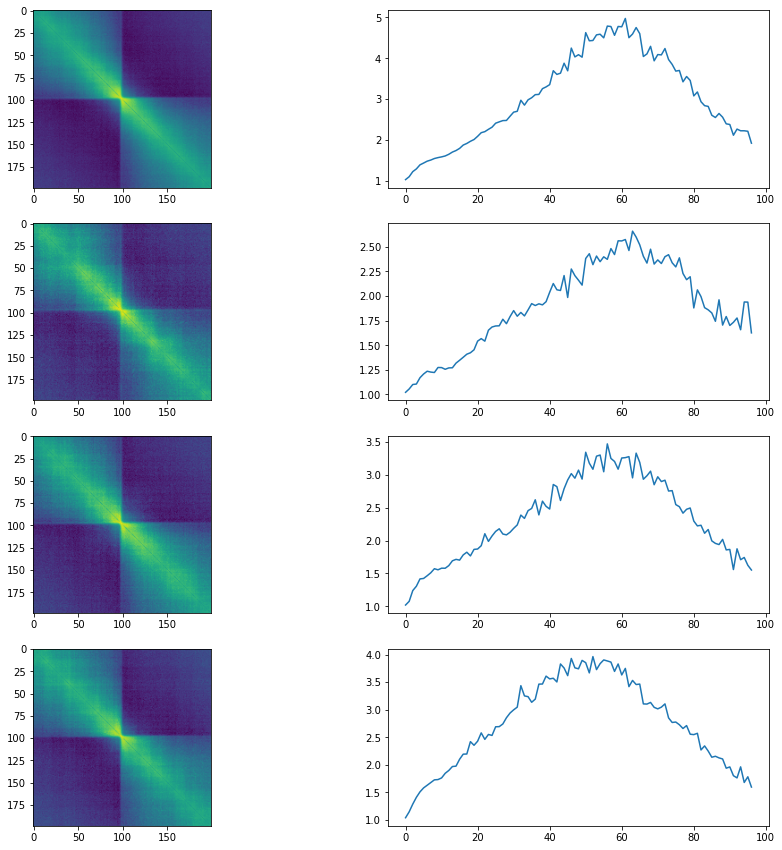

In [387]:
#chriz
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/Chriz:Cell-Line=Kc167#Developmental-Stage=Late-Embryonic-stage#Tissue=Embryo-derived-cell-line:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_277_dm6.gff3')
temp(panels, gff, binsize=500, rad=99)

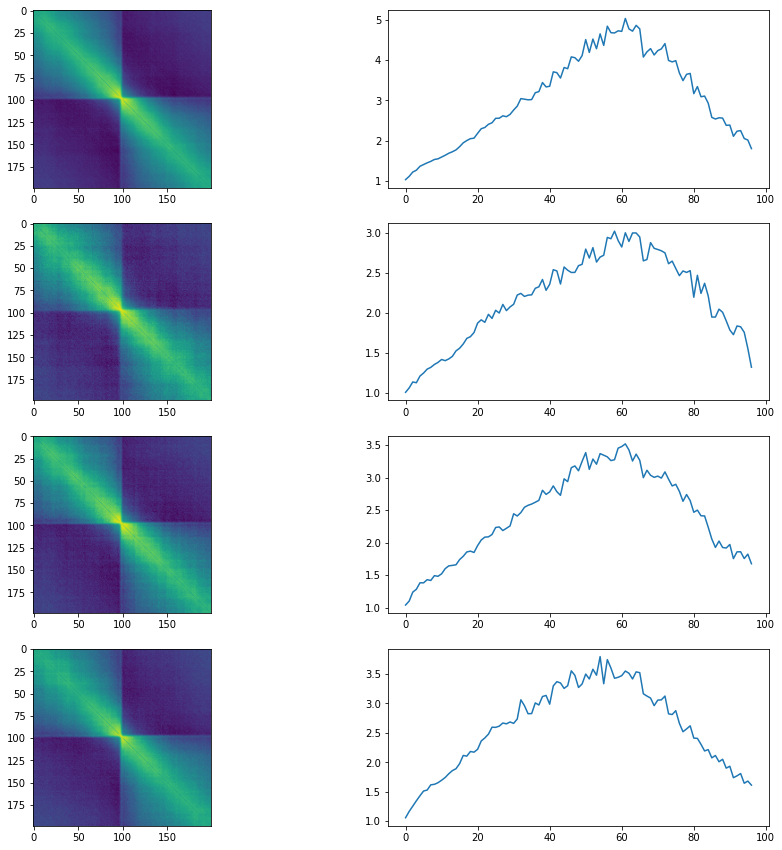

In [388]:
#beaf
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/BEAF-32:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_21_dm6.gff3')
temp(panels, gff, binsize=500, rad=99)

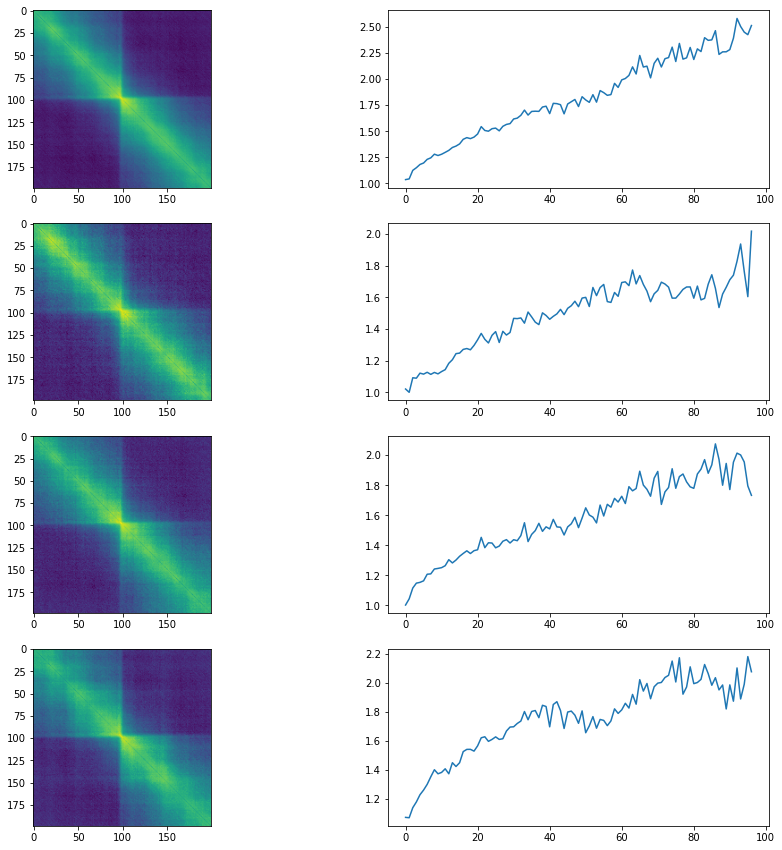

In [389]:
#gaf
gff = load_gff3(
    '/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/GAF:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_23_dm6.gff3')
temp(panels, gff, binsize=500, rad=99)

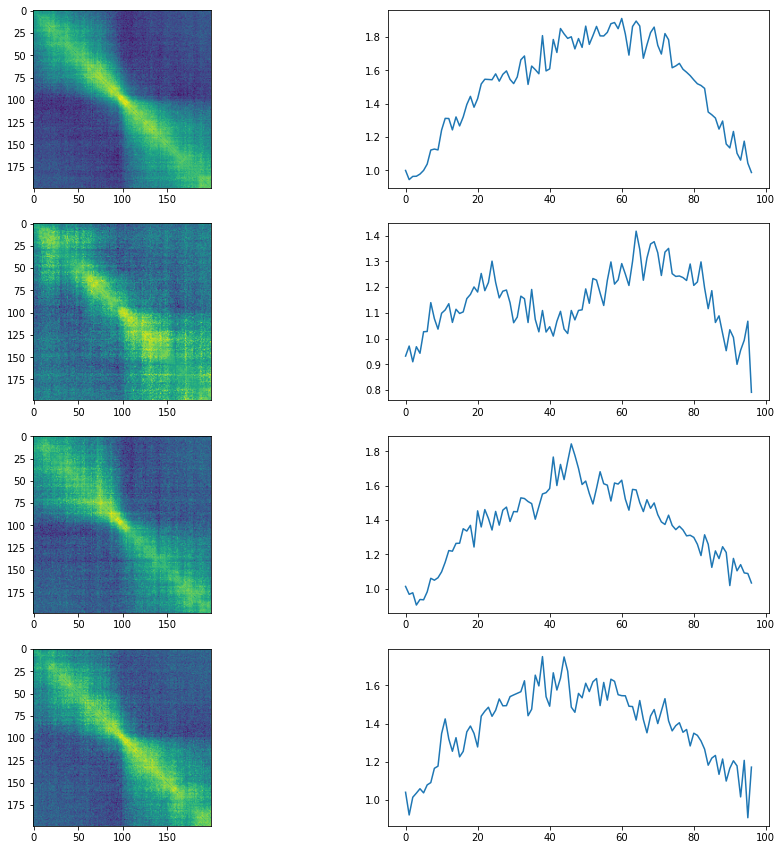

In [411]:
#gaf


gff = load_gff3(
    '/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/MBE_XL52_H2AZ_index6-c14_InpC_500k10k130_peaks_dm6.gff3')
temp(panels, gff, binsize=500, rad=99)

In [477]:
def temp2(panels1, panels2, gff, rad=20, binsize=500):
    t1 = np.percentile(list(gff.iloc[:,2]), (50))
    gff_1 = gff[gff.iloc[:,2] <= t1]
    gff_2 = gff[gff.iloc[:,2] >= t1]
    sig1_norm_all = aggregate_signal_gff_landmarks_norm(panels1, gff, rad, binsize)
    sig1_norm_1 = aggregate_signal_gff_landmarks_norm(panels1, gff_1, rad, binsize)
    sig1_norm_2 = aggregate_signal_gff_landmarks_norm(panels1, gff_2, rad, binsize)
    sig2_norm_all = aggregate_signal_gff_landmarks_norm(panels2, gff, rad, binsize)
    sig2_norm_1 = aggregate_signal_gff_landmarks_norm(panels2, gff_1, rad, binsize)
    sig2_norm_2 = aggregate_signal_gff_landmarks_norm(panels2, gff_2, rad, binsize)
    
    fig, ax = plt.subplots(3,3, figsize=(15,15))
    ax[0][0].imshow(sig1_norm_all)
    ax[1][0].imshow(sig1_norm_1)
    ax[2][0].imshow(sig1_norm_2)
    ax[0][1].imshow(sig2_norm_all)
    ax[1][1].imshow(sig2_norm_1)
    ax[2][1].imshow(sig2_norm_2)
    ax[0][2].plot(insulation_score(sig1_norm_all))
    ax[0][2].plot(insulation_score(sig2_norm_all))
    ax[1][2].plot(insulation_score(sig1_norm_1))
    ax[1][2].plot(insulation_score(sig2_norm_1))
    ax[2][2].plot(insulation_score(sig1_norm_2))
    ax[2][2].plot(insulation_score(sig2_norm_2))
    #ax[2][1].plot(insulation_score(signal_norm_2))
    #ax[3][1].plot(insulation_score(signal_norm_3))

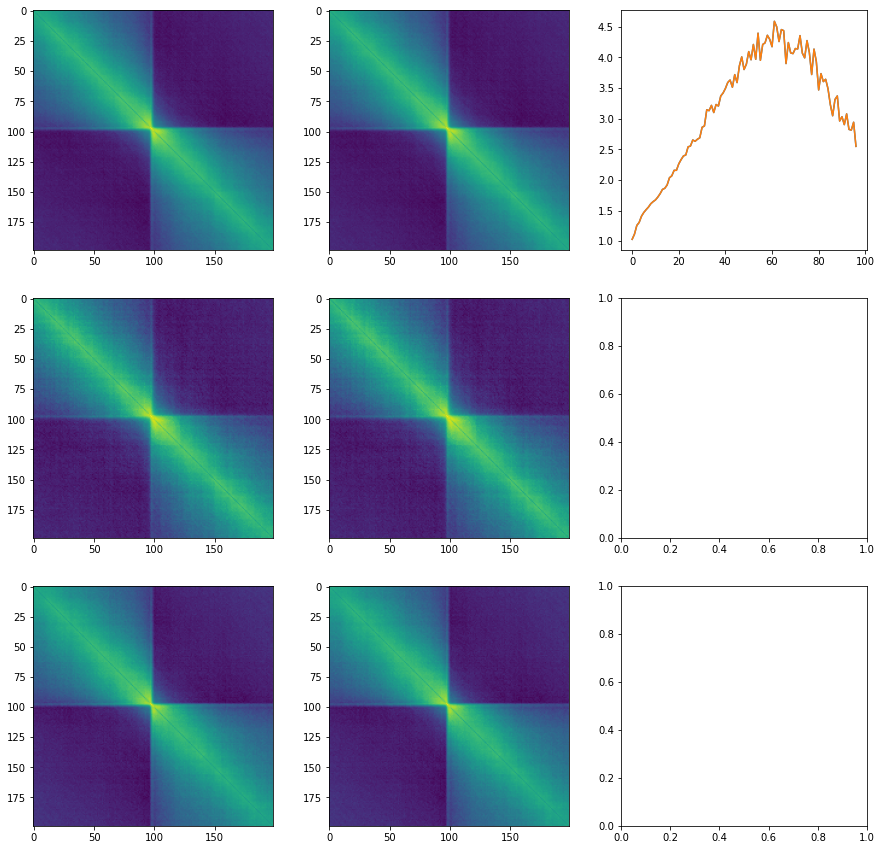

In [423]:
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CP190:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_22_dm6.gff3')
temp2(panels, panels, gff, binsize=500, rad=99)

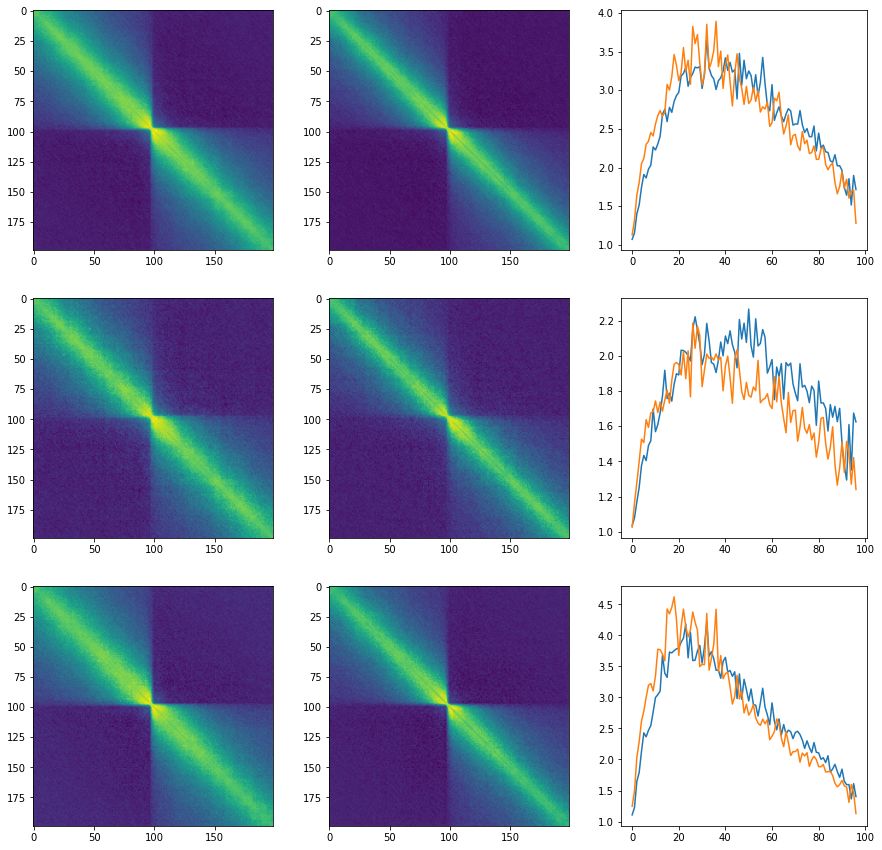

In [479]:
# CP190
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CP190:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_22_dm6.gff3')
temp2(panels66, panels67, gff, binsize=500, rad=99)

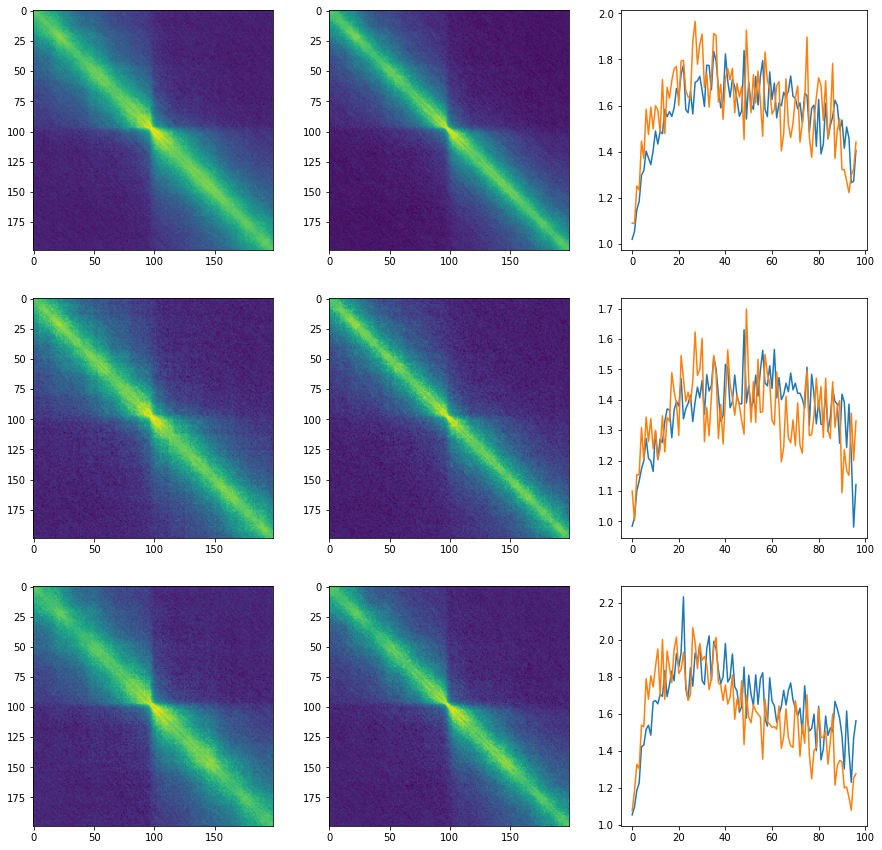

In [480]:
# GAF
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/GAF:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_23_dm6.gff3')
temp2(panels66, panels67, gff, binsize=500, rad=99)

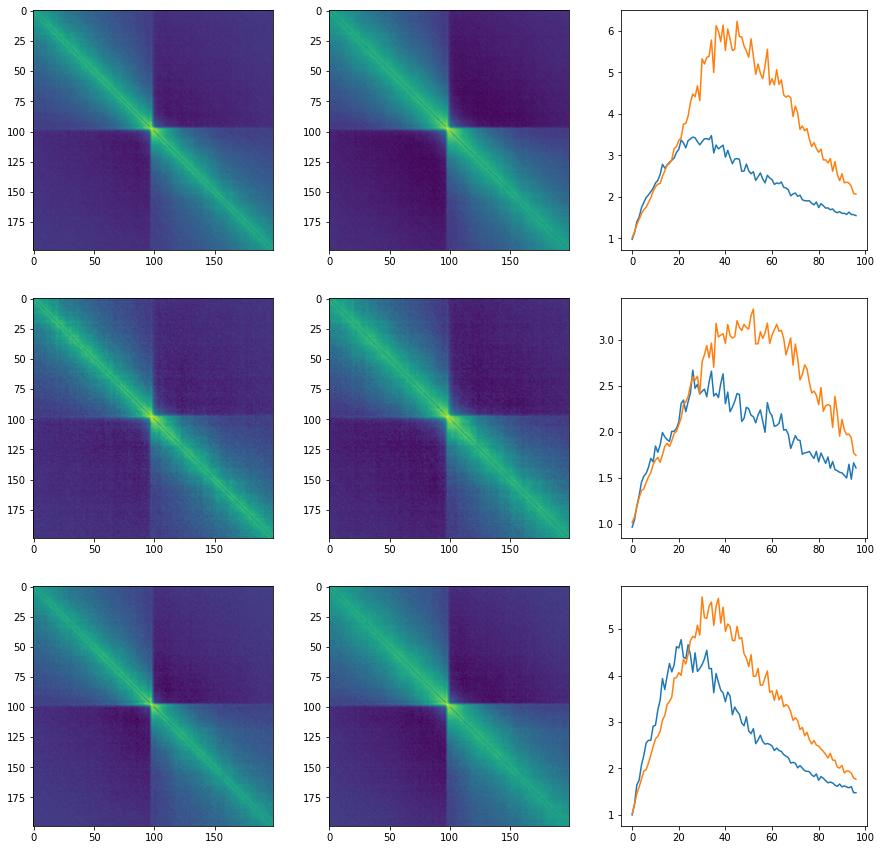

In [481]:
# CP190
panels58 = load_panels('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-58')
panels59 = load_panels('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-59')
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CP190:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_22_dm6.gff3')
temp2(panels58, panels59, gff, binsize=500, rad=99)

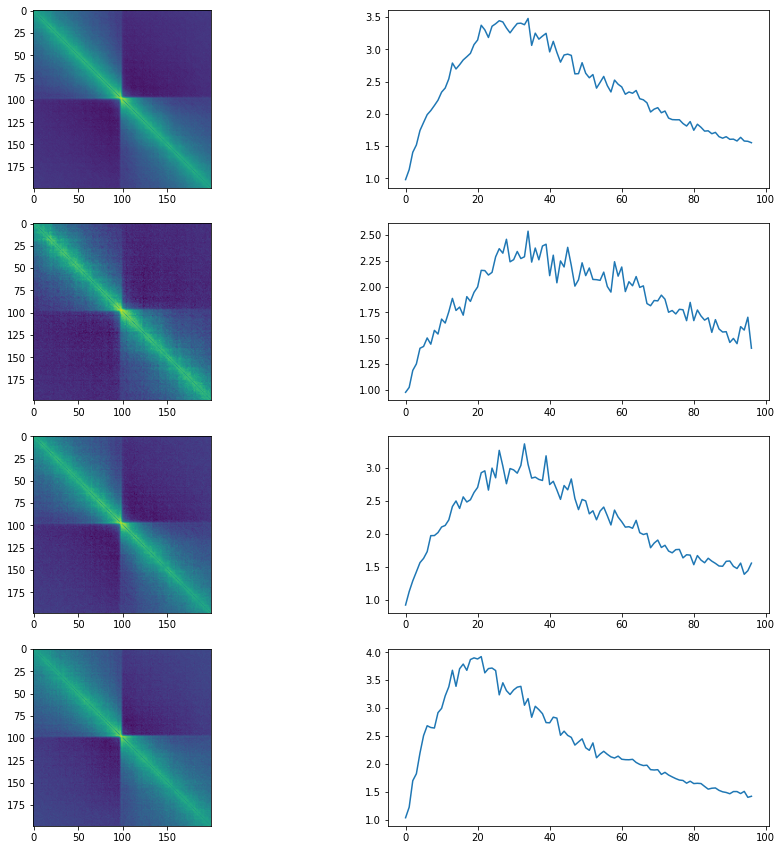

In [482]:
temp(panels58, gff, binsize=500, rad=99)

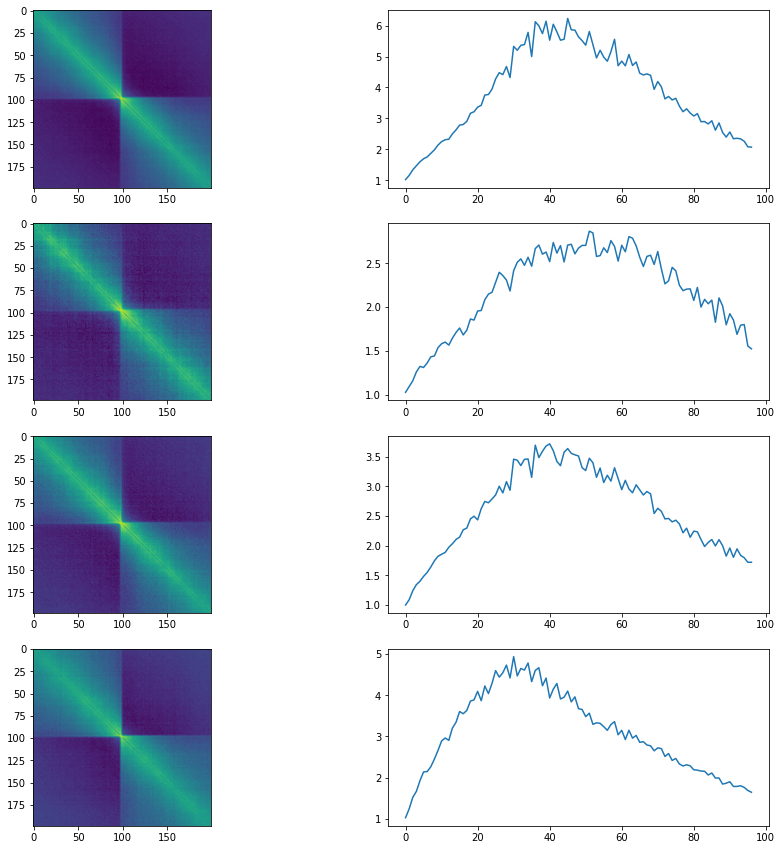

In [483]:
temp(panels59, gff, binsize=500, rad=99)

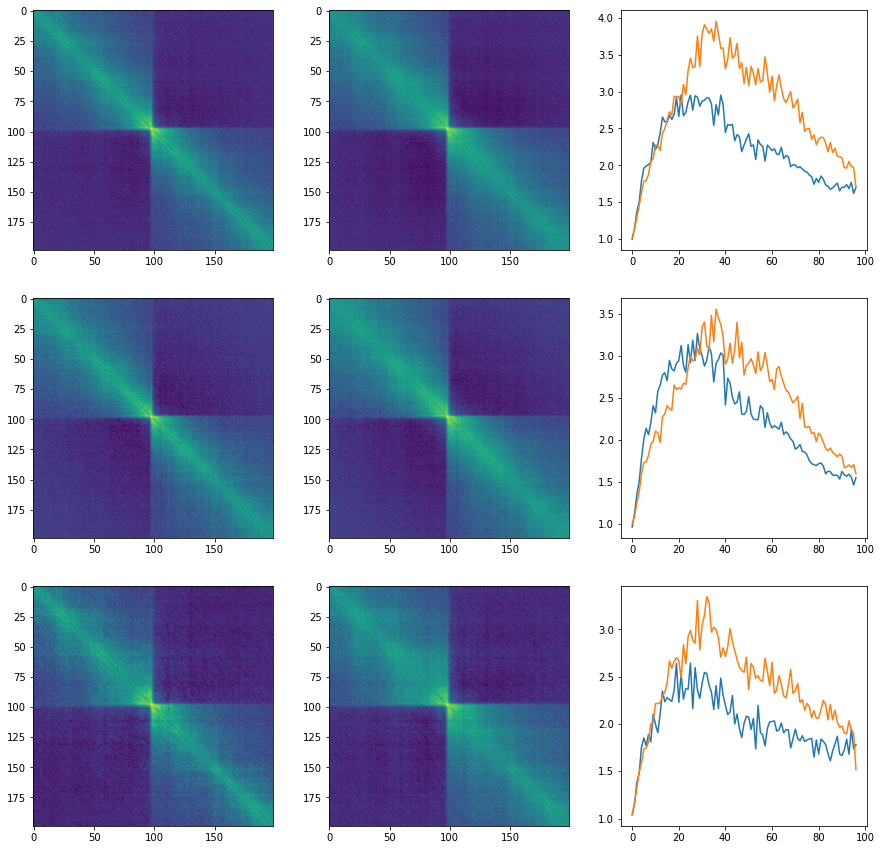

In [484]:
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CTCF:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_769_dm6.gff3')
temp2(panels58, panels59, gff, binsize=500, rad=99)

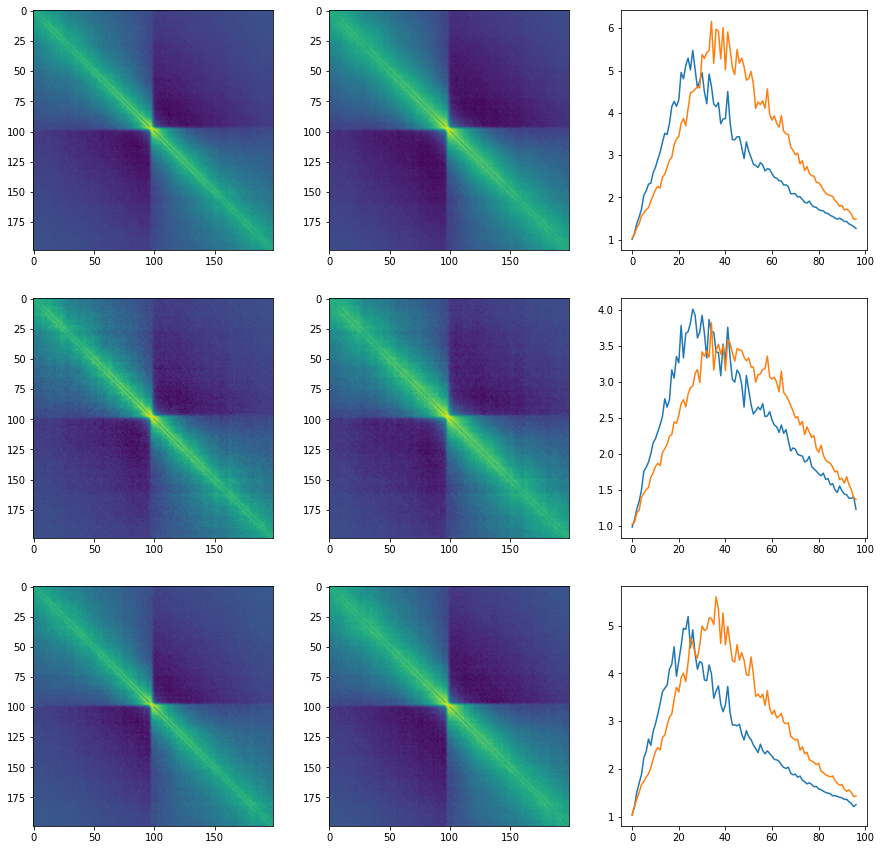

In [485]:
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/BEAF-32:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_21_dm6.gff3')
temp2(panels58, panels59, gff, binsize=500, rad=99)

In [486]:
panels56 = load_panels('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-56')

In [487]:
panels57 = load_panels('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-57')

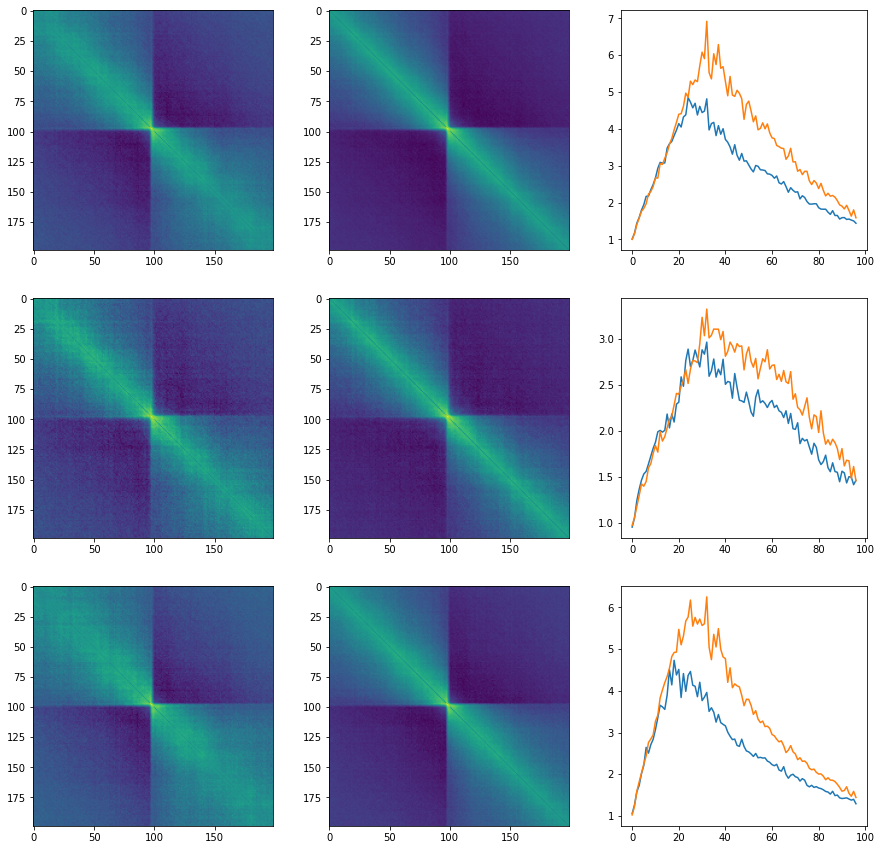

In [488]:
cp190gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CP190:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_22_dm6.gff3')
temp2(panels56, panels57, cp190gff, binsize=500, rad=99)

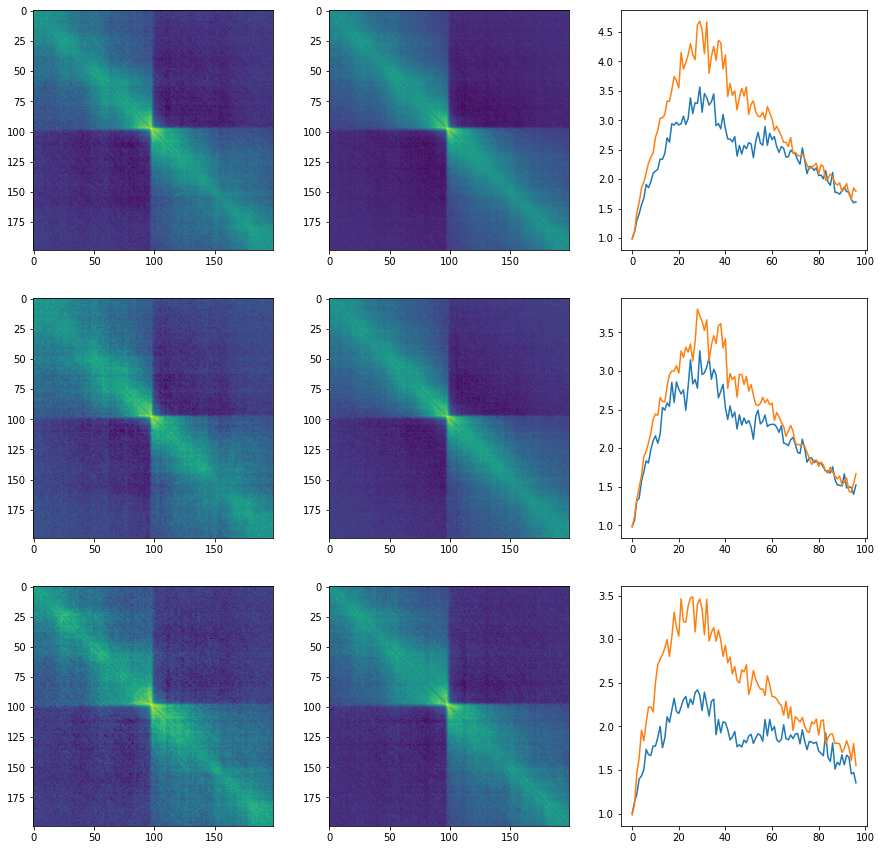

In [489]:
ctcfgff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/data/gffs/CTCF:Developmental-Stage=Embryos-0-12-hr:ChIP-chip:Rep-1::Dmel_r5.32:modENCODE_769_dm6.gff3')
temp2(panels56, panels57, ctcfgff, binsize=500, rad=99)

### Tasks

1. Prep GATC data
2. Prep/get BEAF data
3. Get boundary calls
4. Sort boundary calls by ChIP dominance.

In [490]:
chr_lists = {
	'mel': ['2L', '2R', '3L', '3R', 'X', '4', 'Y'],
	'vir': ['scaffold_13049','scaffold_12963','scaffold_13047','scaffold_12875','scaffold_12855',
	'scaffold_12970','scaffold_12723','scaffold_12928','scaffold_12822','scaffold_13042','scaffold_12958',
	'scaffold_12726','scaffold_13246','scaffold_12823','scaffold_13324','scaffold_12932','scaffold_13052',
	'scaffold_12758','scaffold_13050','scaffold_10324','scaffold_12728','scaffold_12954','scaffold_12472',
	'scaffold_12736','scaffold_12967','scaffold_13045','scaffold_13036','scaffold_12936','scaffold_12799',
	'scaffold_10322','scaffold_12100','scaffold_12734','scaffold_12937','scaffold_12929','scaffold_12941',
	'scaffold_12528','scaffold_12735','scaffold_12815','scaffold_12942','scaffold_10419','scaffold_9476',
	'scaffold_12847','scaffold_12930','scaffold_12790','scaffold_12730','scaffold_12891','scaffold_12952',
	'scaffold_12961','scaffold_12325','scaffold_12960','scaffold_12945','scaffold_12514']
}

In [491]:
im.save_pickle(chr_lists, '/Users/michaelstadler/Bioinformatics/Projects/hic/bin/good_chromosomes.pkl')

In [493]:
im.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/hic/bin/good_chromosomes.pkl')

{'mel': ['2L', '2R', '3L', '3R', 'X', '4', 'Y'],
 'vir': ['scaffold_13049',
  'scaffold_12963',
  'scaffold_13047',
  'scaffold_12875',
  'scaffold_12855',
  'scaffold_12970',
  'scaffold_12723',
  'scaffold_12928',
  'scaffold_12822',
  'scaffold_13042',
  'scaffold_12958',
  'scaffold_12726',
  'scaffold_13246',
  'scaffold_12823',
  'scaffold_13324',
  'scaffold_12932',
  'scaffold_13052',
  'scaffold_12758',
  'scaffold_13050',
  'scaffold_10324',
  'scaffold_12728',
  'scaffold_12954',
  'scaffold_12472',
  'scaffold_12736',
  'scaffold_12967',
  'scaffold_13045',
  'scaffold_13036',
  'scaffold_12936',
  'scaffold_12799',
  'scaffold_10322',
  'scaffold_12100',
  'scaffold_12734',
  'scaffold_12937',
  'scaffold_12929',
  'scaffold_12941',
  'scaffold_12528',
  'scaffold_12735',
  'scaffold_12815',
  'scaffold_12942',
  'scaffold_10419',
  'scaffold_9476',
  'scaffold_12847',
  'scaffold_12930',
  'scaffold_12790',
  'scaffold_12730',
  'scaffold_12891',
  'scaffold_12952',
  'sc

In [494]:
a=[1.2, 3.4]

In [495]:
a[0] = int(a[0])
a

[1, 3.4]

In [497]:
type(a[1])

float

In [520]:
import os
def panels_old_to_new_format(old_folder, new_folder):
    """Convert HiC panels from older format (with row and col names) to newer format.
    
    Args:
        old_folder: string
            Path to folder containing panel files in the old format
        new_folder: string
            Path of folder to write new files to
            
    Returns: None
    """
    old_files = os.listdir(old_folder)
    for old_file in old_files:
        if (re.search('.DS_Store', old_file)):
            continue
        x = np.genfromtxt(os.path.join(old_folder, old_file), skip_header=1)[:,1:]
        np.savetxt(os.path.join(new_folder, old_file),x,newline='\n', fmt='%.6e')
panels_old_to_new_format('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-53-54', '/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-53-54-new')   

### Sort boundaries by ChIP signal

What I want to do is to sort the boundaries into something like CP190-dominated vs. CTCF-dominated, etc. One way to do this is to use the peak calls in gff files, sorting boundaries that have different combinations of proteins. I don't like this for obvious reasons. I'd prefer to use quantitative approach. So I was thinking something like normalize the ChIP signal from the participating proteins and express each protein as a fraction of the total protein signal. As an absolute measure it has all kinds of problems, but as a relative measure (ranking) it may work. It certainly should work for 2-protein comparisons (e.g., CP190 vs. CTCF, rank according to more CTCF or more CP190).

In [701]:
############################################################################
def features_assign_chip_scores(feature_file, signal_files, outfolder, 
            outputname, names, norm=True, width=2, feature_file_cols=[0,1], 
            signal_file_cols=[0,1,3], max_chr_size = 5e7, binsize=500):
    """Assign relative scores to genomic features from ChIP-like input data
    
    The concept is that boundaries are sites of combinatoric insulator protein
    binding, but that different different boundaries have distinct combinations
    of protein binding, with individual proteins more "dominant" at some
    boundaries than others. To this end, input ChIP signals are first normalized,
    then each boundary (or other feature) is assigned a score for each protein
    as a fraction of the total ChIP signal at that boundary. So, protein X
    will have a high score at a boundary where its signal is high but there is 
    little signal for the other proteins in the set. The output is a gff-like 
    file for each protein with the fractional score in the score column. This 
    file can be used as input to other scripts and functions.
    
    Args:
        feature_file:
            File containing genomic features (boundaries)
        signal_files: list-like
            Files containing ChIP-like data (genome-wide, continuous)
        outfolder: string
            Path to folder to write outfile
        
        
        outputname: string
            Name for output files to which names entry is appended.
        names: list-like, iterable
            Names corresponding to the signal files to be used in output files
        norm: bool
            If true, reports ChIP signal as a fraction of total ChIP signal. 
            Otherwise, just reports the ChIP signal itself.
        width: int
            Width, in bins, of the region used to calculate the signal at each 
            feature
        feature_file_cols: list
            Columns in the feature file corresponding to [chromosome, position]
        signal_file_cols: list
            Columns in the signal files corresponding to [chromosome, position
            score/value]
        max_chr_size: int
            Max size of chromosomes, in base pairs (used for memory allocation)
        binsize: int
            Size, in base pairs, of bins in signal files
        
        
    """
    # Read in data from signal files.
    max_chr_bin = int(max_chr_size / binsize)
    # Store signal in dict of ndarray, keys are chromosomes, dim1 is signal ID (
    # one per signal file) dim2 is genomic position.
    signal = {}
    for i in range(0, len(signal_files)):
        signal_file = signal_files[i]
        with open(signal_file, 'r') as f:
            for line in f:
                chr_, loc, val = np.array(line.rstrip().split())[signal_file_cols]
                chr_ = re.sub('chr', '', chr_)
                if (chr_ not in signal):
                    signal[chr_] = np.ndarray((max_chr_bin, len(signal_files)))
                bin_ = int(int(loc) / binsize)
                signal[chr_][bin_, i] = val
    
    # Normalize signals.
    for chr_ in signal.keys():
        sums = np.sum(signal[chr_], axis=0)
        sums_mean = np.mean(sums)
        signal[chr_] = signal[chr_] / sums * sums_mean
    
    # Read features into dict of list, keys are chromosomes, list entries are
    # genomic positions.
    features = {}
    with open(feature_file, 'r') as f:
        for line in f:
            items = np.array(line.rstrip().split())
            chr_, loc = items[feature_file_cols]
            chr_ = re.sub('chr', '', chr_)
            bin_ = int(int(loc) / binsize)
            if (chr_ not in features):
                features[chr_] = []
            features[chr_].append(bin_)
    
    # Write out file for each input signal.
    for i in range(0, len(signal_files)):
        outfile = os.path.join(outfolder, outputname + names[i] + '.txt')
        with open(outfile, 'w') as out:
            for chr_ in features:
                for bin_ in features[chr_]:
                    # Take the mean value for each signal in the window defined by width.
                    means = np.mean(signal[chr_][(bin_-width):(bin_+width+1)], axis=0)
                    # For each signal, value is either the mean signal or its fraction 
                    # of the total signal.
                    if (norm):
                        means_sum = np.sum(means)
                        if (means_sum > 0):
                            value = means[i] / means_sum
                        else:
                            value = np.nan
                    else:
                        value = means[i]
                    if (not np.isnan(value)):
                        pos = str(bin_ * binsize)
                        out.write(chr_ + '\t.\t.\t' + pos + '\t' + pos + '\t' + str(value) + '\t.\t.\t.\n')
                    
                            
            
            

signal_files = ['/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/viewer_tracks/CP190_0_12h.txt',
               '/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/viewer_tracks/dCTCF_0_12h.txt',
               '/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/viewer_tracks/BEAF-32_0_12h.txt'
               ]
feature_file = '/Users/michaelstadler/Bioinformatics/Projects/hic/data/nc14_all_dm6_CompressedBinCounts_500bp_weightedDirectionality_w30d2a0.5_boundarieScore_w5_thresh_2_2_sorted_top1000_mergewithHand_1001bp.txt'
outfolder = '/Users/michaelstadler/Bioinformatics/Projects/hic'
features_assign_chip_scores(feature_file, signal_files, outfolder, 'topboundaries-CP-CT-BE-relsig-', ['CP190', 'CTCF', 'BEAF-32'], width=2, norm=True)

In [704]:
def temp3(panels1, panels2, gff, rad=20, binsize=500):
    t1, t2 = np.percentile(list(gff.iloc[:,2]), (33,66))
    gff_1 = gff[gff.iloc[:,2] <= t1]
    gff_2 = gff[(gff.iloc[:,2] > t1) & (gff.iloc[:,2] < t2)]
    gff_3 = gff[gff.iloc[:,2] >= t2]

    sig1_norm_all = aggregate_signal_gff_landmarks_norm(panels1, gff, rad, binsize)
    sig1_norm_1 = aggregate_signal_gff_landmarks_norm(panels1, gff_1, rad, binsize)
    sig1_norm_2 = aggregate_signal_gff_landmarks_norm(panels1, gff_2, rad, binsize)
    sig1_norm_3 = aggregate_signal_gff_landmarks_norm(panels1, gff_3, rad, binsize)
    sig2_norm_all = aggregate_signal_gff_landmarks_norm(panels2, gff, rad, binsize)
    sig2_norm_1 = aggregate_signal_gff_landmarks_norm(panels2, gff_1, rad, binsize)
    sig2_norm_2 = aggregate_signal_gff_landmarks_norm(panels2, gff_2, rad, binsize)
    sig2_norm_3 = aggregate_signal_gff_landmarks_norm(panels2, gff_3, rad, binsize)
    
    fig, ax = plt.subplots(4,3, figsize=(15,15))
    ax[0][0].imshow(sig1_norm_all)
    ax[1][0].imshow(sig1_norm_1)
    ax[2][0].imshow(sig1_norm_2)
    ax[3][0].imshow(sig1_norm_3)
    ax[0][1].imshow(sig2_norm_all)
    ax[1][1].imshow(sig2_norm_1)
    ax[2][1].imshow(sig2_norm_2)
    ax[3][1].imshow(sig2_norm_3)
    ax[0][2].plot(insulation_score(sig1_norm_all))
    ax[0][2].plot(insulation_score(sig2_norm_all))
    ax[1][2].plot(insulation_score(sig1_norm_1))
    ax[1][2].plot(insulation_score(sig2_norm_1))
    ax[2][2].plot(insulation_score(sig1_norm_2))
    ax[2][2].plot(insulation_score(sig2_norm_2))
    ax[3][2].plot(insulation_score(sig1_norm_3))
    ax[3][2].plot(insulation_score(sig2_norm_3))
    #ax[2][1].plot(insulation_score(signal_norm_2))
    #ax[3][1].plot(insulation_score(signal_norm_3))

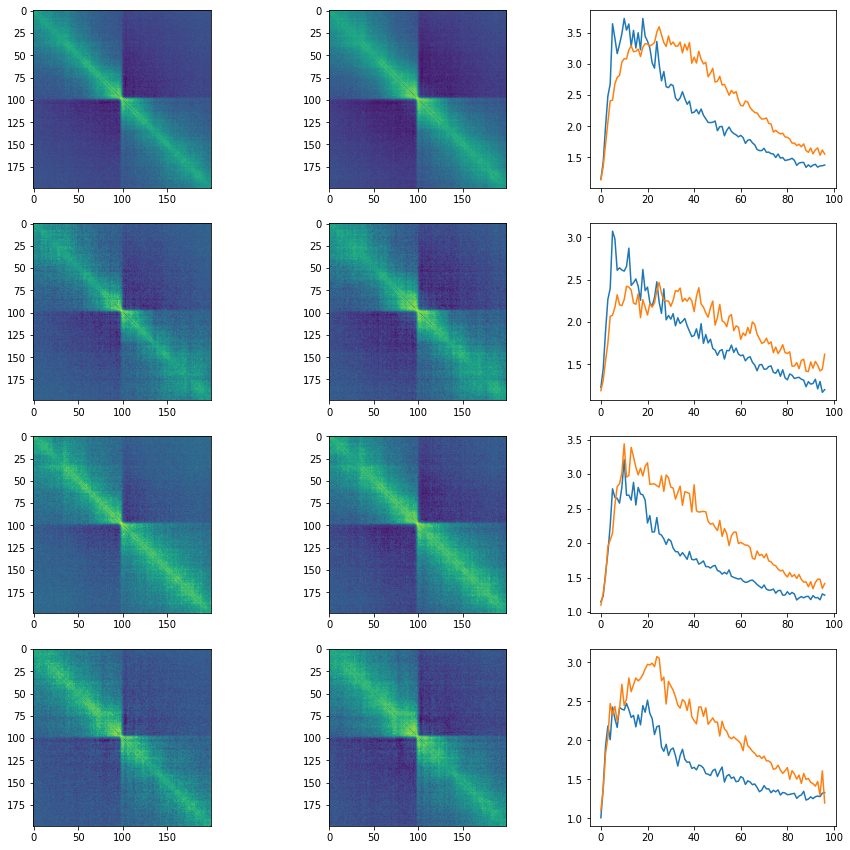

In [705]:
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/topboundaries-CP-CT-BE-relsig-CP190.txt')
temp3(panels58, panels59, gff, rad=99)

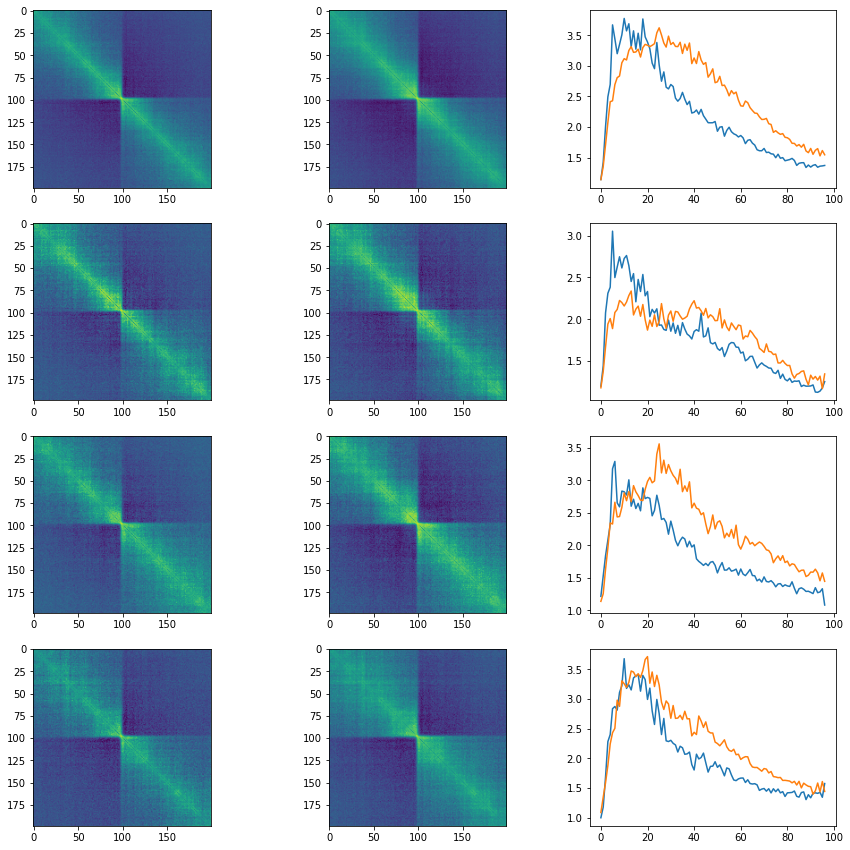

In [706]:
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/topboundaries-nonorm-CP190.txt')
temp3(panels58, panels59, gff, rad=99)

In [709]:
panels56 = load_panels('/Users/michaelstadler/Bioinformatics/Projects/hic/viewerfiles/hic-56')

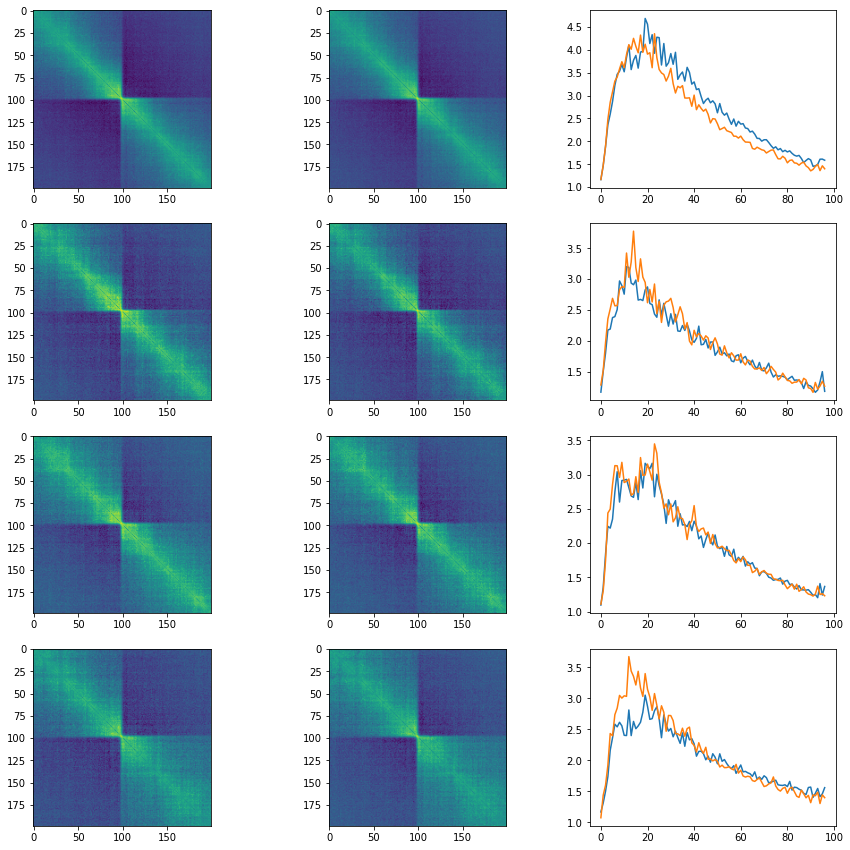

In [710]:
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/topboundaries-CP-CT-BE-relsig-CTCF.txt')
temp3(panels56, panels57, gff, rad=99)

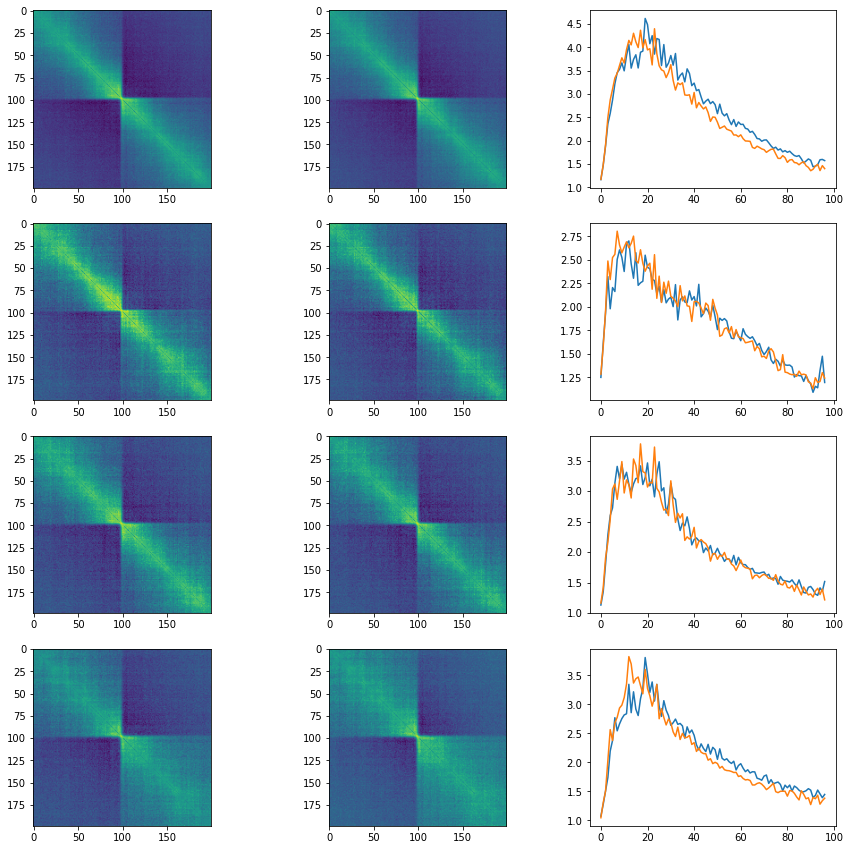

In [711]:
gff = load_gff3('/Users/michaelstadler/Bioinformatics/Projects/hic/topboundaries-nonorm-CTCF.txt')
temp3(panels56, panels57, gff, rad=99)

In [714]:
del panels58
del panels59

In [1]:
############################################################################
def plot_aggregate_features(panels, gff, rad=99, binsize=500):
    """Plot aggregate Hi-C signal and insulation score for a genomic feature set
    
    Plots the aggregate (sum/mean) Hi-C score around a set of features supplied
    in a gff file, and uses the score feature of the gff to split the features
    into thirds and plots the same for these splits. The top row is for the
    entire set, row 2-4 are for thirds with successively higher scores.
    
    Args:
        panels: dict of dict of ndarray
            Hi-C data panels. Keys are chromosome, then bin1 (left-most), value
            is 2d numpy ndarray with hi-c data.
        gff: pandas DF
            gff object produced by load_gff. Each row is gff entry, col 0: 
            chromosome, 1: mean position, 2: score
        rad: int
            The 'radius' of the window for the aggregate score. Length of
            matrix will be 2*rad + 1.
        binsize: int
            The bin size, in bp, of the data to use (500, 1000, 2000, 4000)
    
    Returns: None
    """
    t1, t2 = np.percentile(list(gff.iloc[:,2]), (33, 66))
    gff_1 = gff[gff.iloc[:,2] <= t1]
    gff_2 = gff[(gff.iloc[:,2] > t1) & (gff.iloc[:,2] < t2)]
    gff_3 = gff[gff.iloc[:,2] >= t2]
    signal_norm_all = aggregate_signal_gff_landmarks_norm(panels, gff, rad, binsize)
    signal_norm_1 = aggregate_signal_gff_landmarks_norm(panels, gff_1, rad, binsize)
    signal_norm_2 = aggregate_signal_gff_landmarks_norm(panels, gff_2, rad, binsize)
    signal_norm_3 = aggregate_signal_gff_landmarks_norm(panels, gff_3, rad, binsize)
    
    fig, ax = plt.subplots(4,2, figsize=(15,15))
    ax[0][0].imshow(signal_norm_all)
    ax[1][0].imshow(signal_norm_1)
    ax[2][0].imshow(signal_norm_2)
    ax[3][0].imshow(signal_norm_3)
    ax[0][1].plot(insulation_score(signal_norm_all))
    ax[1][1].plot(insulation_score(signal_norm_1))
    ax[2][1].plot(insulation_score(signal_norm_2))
    ax[3][1].plot(insulation_score(signal_norm_3))

############################################################################
def plot_aggregate_features_compare(panels1, panels2, gff, rad=99, binsize=500):
    """Plot aggregate Hi-C signal and insulation score for a genomic feature set
    in two Hi-C datasets
    
    Plots the aggregate (sum/mean) Hi-C score around a set of features supplied
    in a gff file as well as the insulation-distance plot for the aggregate data.
    Uses the score feature of the gff to split the features into thirds and plots 
    the same for these splits. The top row is for the entire set, row 2-4 are for 
    thirds with successively higher scores. Aggregate plots for panels1 is plotted 
    in col 0, panels2 in col 1, and insulation-distance plots are overlaid in 
    col 2. Data for panels1 is in blue, for panels2 in orange.
    
    Args:
        panels1, panels2: dict of dict of ndarray
            Hi-C data panels. Keys are chromosome, then bin1 (left-most), value
            is 2d numpy ndarray with hi-c data.
        gff: pandas DF
            gff object produced by load_gff. Each row is gff entry, col 0: 
            chromosome, 1: mean position, 2: score
        rad: int
            The 'radius' of the window for the aggregate score. Length of
            matrix will be 2*rad + 1.
        binsize: int
            The bin size, in bp, of the data to use (500, 1000, 2000, 4000)
    
    Returns: None
    """
    t1, t2 = np.percentile(list(gff.iloc[:,2]), (33,66))
    gff_1 = gff[gff.iloc[:,2] <= t1]
    gff_2 = gff[(gff.iloc[:,2] > t1) & (gff.iloc[:,2] < t2)]
    gff_3 = gff[gff.iloc[:,2] >= t2]

    sig1_norm_all = aggregate_signal_gff_landmarks_norm(panels1, gff, rad, binsize)
    sig1_norm_1 = aggregate_signal_gff_landmarks_norm(panels1, gff_1, rad, binsize)
    sig1_norm_2 = aggregate_signal_gff_landmarks_norm(panels1, gff_2, rad, binsize)
    sig1_norm_3 = aggregate_signal_gff_landmarks_norm(panels1, gff_3, rad, binsize)
    sig2_norm_all = aggregate_signal_gff_landmarks_norm(panels2, gff, rad, binsize)
    sig2_norm_1 = aggregate_signal_gff_landmarks_norm(panels2, gff_1, rad, binsize)
    sig2_norm_2 = aggregate_signal_gff_landmarks_norm(panels2, gff_2, rad, binsize)
    sig2_norm_3 = aggregate_signal_gff_landmarks_norm(panels2, gff_3, rad, binsize)
    
    fig, ax = plt.subplots(4,3, figsize=(15,15))
    ax[0][0].imshow(sig1_norm_all)
    ax[1][0].imshow(sig1_norm_1)
    ax[2][0].imshow(sig1_norm_2)
    ax[3][0].imshow(sig1_norm_3)
    ax[0][1].imshow(sig2_norm_all)
    ax[1][1].imshow(sig2_norm_1)
    ax[2][1].imshow(sig2_norm_2)
    ax[3][1].imshow(sig2_norm_3)
    ax[0][2].plot(insulation_score(sig1_norm_all))
    ax[0][2].plot(insulation_score(sig2_norm_all))
    ax[1][2].plot(insulation_score(sig1_norm_1))
    ax[1][2].plot(insulation_score(sig2_norm_1))
    ax[2][2].plot(insulation_score(sig1_norm_2))
    ax[2][2].plot(insulation_score(sig2_norm_2))
    ax[3][2].plot(insulation_score(sig1_norm_3))
    ax[3][2].plot(insulation_score(sig2_norm_3))